In [1]:
from PIL import Image

In [2]:
im = Image.open('all_unown.png')

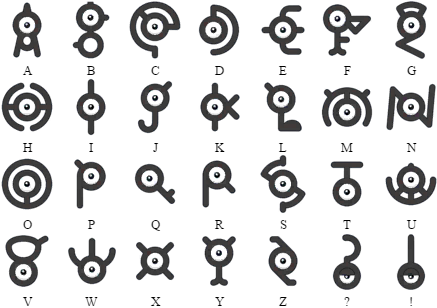

In [3]:
display(im)

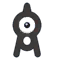

In [4]:
display(im.crop((0,0,62,62)))

In [5]:
# Convert into list char_imgs
letters = []
swidth = im.width//7
sheight = im.height//4
for j in range(0, im.height, sheight):
    for i in range(0, im.width, swidth)[:-1]:
        letters.append(im.crop((i+2,j,i+swidth+2,j+sheight))) # +2 is small adjustments in width
letters = [a.crop((0,0,swidth,62)) for a in letters] # Crop out the letter on the bottom and make square

In [6]:
# Get plaintext
# Transcript from https://poohadventures.fandom.com/wiki/Pok%C3%A9mon_I_Choose_You!/(Transcript)
import re
from collections import Counter
with open('pokemon_ep1_transcript_unedited.txt') as f:
    text = f.read()
    text = re.sub('^[^:]+: ', '', text, flags=re.MULTILINE) # Remove names from before dialog
    text = text.replace('é', 'e') # Pokémon -> Pokemon
    text = text.lower() # Only lowercase letters
    text = re.sub('[^a-z]', '', text) # Remove non alpha characters

text += "theflagis"
text += "uscgitsunown"

In [7]:
# Create substitution array
import random
cipher_alpha = list('abcdefghijklmnopqrstuvwxyz')
random.shuffle(cipher_alpha)
print(cipher_alpha)

['y', 'h', 'i', 'm', 'n', 't', 'c', 'l', 'a', 'j', 'k', 'q', 'w', 'd', 'b', 'p', 'v', 'o', 'r', 'u', 's', 'x', 'z', 'e', 'f', 'g']


In [8]:
# Create Ciphertext
cipher = ''.join(cipher_alpha[ord(c) - ord('a')] for c in text)

In [9]:
# Choose dims of the ciphertext img
print(len(text))
print(88*128)

11264
11264


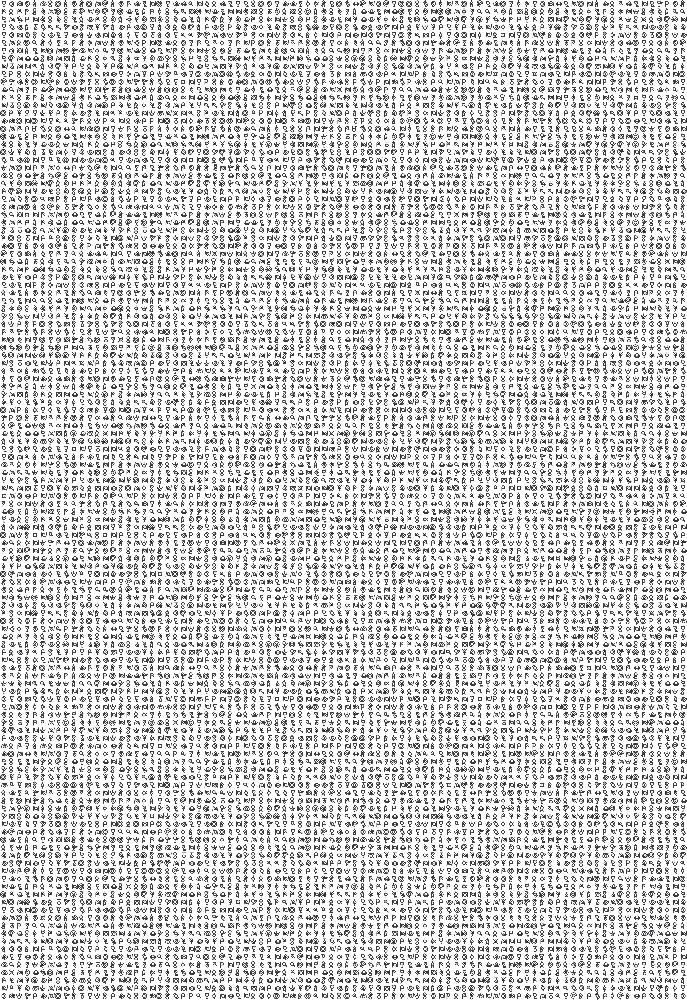

In [10]:
# Create cipher_img
sw, sh = 62, 62
cipher_img = Image.new('RGBA', (sw*88, sh*128))
for r in range(128):
    for c in range(88):
        cipher_img.paste(letters[ord(cipher[r*88+c])-ord('a')], (c*sw, r*sh))
display(cipher_img)
cipher_img.save('ciphertext.png')